In [7]:
!pip install requests pandas python-dateutil plotly

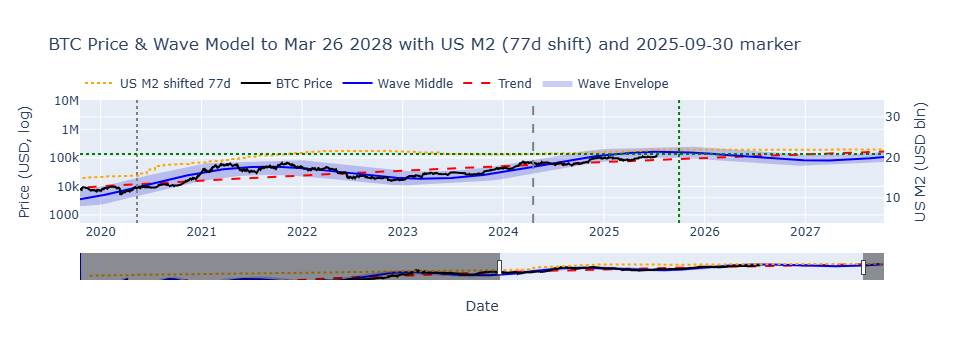

In [55]:
# Updated Interactive Plot with Green Grid Line on September 30, 2025

import requests
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from datetime import datetime
from math import log10, sin, pi

# 1) FRED fetch helper
API_KEY  = "ba5525cc9cf29a46525360eb07c0a7cc"
BASE_URL = "https://api.stlouisfed.org/fred/series/observations"
def fetch_fred(series_id, start="2010-07-24", end=None):
    params = {"series_id": series_id, "api_key": API_KEY,
              "file_type": "json", "observation_start": start}
    if end:
        params["observation_end"] = end
    r = requests.get(BASE_URL, params=params, timeout=10)
    r.raise_for_status()
    data = r.json()["observations"]
    df = pd.DataFrame(data)
    df["date"]  = pd.to_datetime(df["date"])
    df["value"] = pd.to_numeric(df["value"], errors="coerce")
    return df.set_index("date")["value"]

# 2) Halving dates & avg ms/block
H0_33, H0_66 = datetime(2010,7,24,17,50,42), datetime(2011,8,7,19,49,38)
H1 = datetime(2012,11,28,16,24,38)
H2 = datetime(2016,7,9,18,46,13)
H3 = datetime(2020,5,11,21,23,43)
H4 = datetime(2028,3,26)  # next halving

bm0    = 699768
bm0_33 = 467896
bm0_66 = 591047
bm1    = 542715
bm2    = 576868
bm3    = 593781

# 3) Convert date → halving-time h
def halving_time(t):
    t_ms = t.timestamp() * 1000
    if t < H0_33:
        return t_ms / (bm0 * 70000)
    elif t < H0_66:
        return 0.33 + (t_ms - H0_33.timestamp()*1000) / (bm0_33 * 70000)
    elif t < H1:
        return 0.66 + (t_ms - H0_66.timestamp()*1000) / (bm0_66 * 70000)
    elif t < H2:
        return 1.0 + (t_ms - H1.timestamp()*1000) / (bm1 * 210000)
    elif t < H3:
        return 2.0 + (t_ms - H2.timestamp()*1000) / (bm2 * 210000)
    else:
        return 3.0 + (t_ms - H3.timestamp()*1000) / (bm3 * 210000)

# 4) Trend & envelope
a, b = 1.48, 5.44
def btc_trend(h):
    return 10**(a + b * np.log10(h))

def wave_envelope(h, tr):
    wcr, width = 0.25, 0.75
    phase = 0.75 / h
    osc = sin(2*pi*h - phase)
    up = min(width, osc)
    dn = max(-width, osc)
    decay = (1 - wcr)**h
    return (
        tr * 10**(decay * (up + width)),
        tr * 10**(decay * (dn - width)),
        tr * 10**(decay * osc)
    )

# 5) Fetch real data
today_str = pd.Timestamp.today().strftime("%Y-%m-%d")
btc_real  = fetch_fred("CBBTCUSD", "2010-07-24", today_str).resample("D").ffill()
m2_real   = fetch_fred("M2SL",     "2010-07-24", today_str).resample("D").ffill() / 1e3

# 6) Extend M2 & shift
full_idx   = pd.date_range("2010-07-24", H4, freq="D")
m2_ext     = m2_real.reindex(full_idx).ffill()
m2_shifted = m2_ext.shift(77)

# 7) Compute model
trends, uppers, lowers, middles = [], [], [], []
for t in full_idx:
    h = halving_time(t)
    tr = btc_trend(h)
    up, dn, mid = wave_envelope(h, tr)
    trends.append(tr)
    uppers.append(up)
    lowers.append(dn)
    middles.append(mid)
trends, uppers, lowers, middles = map(np.array, (trends, uppers, lowers, middles))

# 8) Halving & midpoint lines
halvings  = [H1, H2, H3, H4]
midpoints = [halvings[i] + (halvings[i+1] - halvings[i]) / 2 for i in range(3)]

# 9) Build interactive Plotly figure
fig = go.Figure()

# Wave envelope
fig.add_trace(go.Scatter(x=full_idx, y=uppers, line=dict(color='rgba(0,0,0,0)'), showlegend=False))
fig.add_trace(go.Scatter(x=full_idx, y=lowers, fill='tonexty', fillcolor='rgba(0,0,200,0.2)',
                         line=dict(color='rgba(0,0,0,0)'), name='Wave Envelope'))

# Trend & middle
fig.add_trace(go.Scatter(x=full_idx, y=trends,  mode='lines',
                         line=dict(color='red', dash='dash'), name='Trend'))
fig.add_trace(go.Scatter(x=full_idx, y=middles, mode='lines',
                         line=dict(color='blue'), name='Wave Middle'))

# Real BTC & M2
fig.add_trace(go.Scatter(x=btc_real.index, y=btc_real.values, mode='lines',
                         line=dict(color='black'), name='BTC Price'))
fig.add_trace(go.Scatter(x=full_idx, y=m2_shifted, mode='lines',
                         line=dict(color='orange', dash='dot'), name='US M2 shifted 77d', yaxis='y2'))

# Halving lines
for d in halvings:
    fig.add_vline(x=d, line=dict(color='gray', dash='dot'))
for d in midpoints:
    fig.add_vline(x=d, line=dict(color='gray', dash='dash'))

# Add green grid line on Sept 30 2025
fig.add_vline(x="2025-09-30", line=dict(color='green'), name='2025-09-30')
fig.add_hline(y="138000", line=dict(color='green'), name='$138,000')
# 10) Layout & initial view
y0, y1 = log10(2000), log10(250000)
fig.update_layout(
    title="BTC Price & Wave Model to Mar 26 2028\nwith US M2 (77d shift) and 2025‑09‑30 marker",
    xaxis=dict(title='Date', range=['2018-01-01','2026-12-31'], rangeslider=dict(visible=True),
               type='date', fixedrange=False),
    yaxis=dict(title='Price (USD, log)', type='log', range=[y0,y1], fixedrange=False),
    yaxis2=dict(title='US M2 (USD bln)', overlaying='y', side='right', fixedrange=False),
    dragmode='zoom', hovermode='x unified', height=700,
    legend=dict(orientation='h', y=1.02, x=0)
)

# 11) Show with zoom controls
fig.show(config={'scrollZoom':True, 'modeBarButtonsToAdd':['zoom2d','zoomY']})


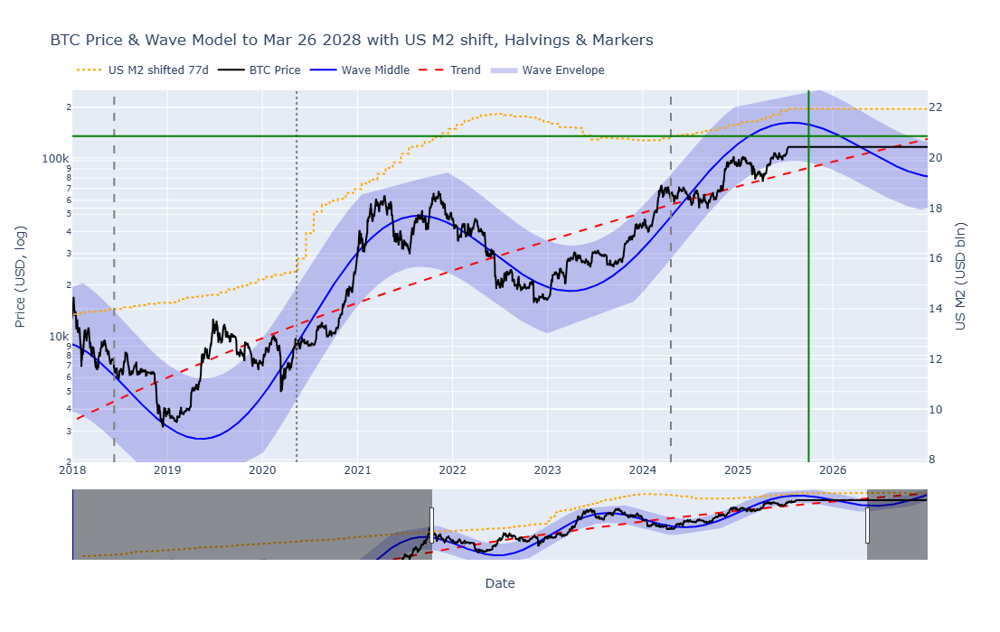

In [56]:
# Refactored Interactive BTC vs. M2 Plot with Wave Model and Halving Lines

# If needed, install dependencies (uncomment in Jupyter):
# !pip install pandas numpy scipy requests plotly

import requests
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from datetime import datetime
from math import log10, sin, pi

# ----------------------------------------
# 1) Data Fetching
# ----------------------------------------
def fetch_fred_series(series_id: str, start: str, end: str = None) -> pd.Series:
    """
    Fetches a FRED series as a pandas Series of daily values.
    Params:
      - series_id: e.g., "CBBTCUSD" or "M2SL"
      - start: "YYYY-MM-DD"
      - end: optional "YYYY-MM-DD"
    Returns:
      - Series indexed by date with numeric values.
    """
    API_KEY  = "ba5525cc9cf29a46525360eb07c0a7cc"
    URL      = "https://api.stlouisfed.org/fred/series/observations"
    params = {
        "series_id": series_id,
        "api_key":    API_KEY,
        "file_type":  "json",
        "observation_start": start
    }
    if end:
        params["observation_end"] = end
    r = requests.get(URL, params=params, timeout=10)
    r.raise_for_status()
    data = r.json()["observations"]
    df = pd.DataFrame(data)
    df["date"]  = pd.to_datetime(df["date"])
    df["value"] = pd.to_numeric(df["value"], errors="coerce")
    return df.set_index("date")["value"].resample("D").ffill()

# ----------------------------------------
# 2) Halving-Cycle Time Conversion
# ----------------------------------------
# Pre-defined halving dates
H0_33 = datetime(2010, 7, 24, 17, 50, 42)
H0_66 = datetime(2011, 8,  7, 19, 49, 38)
H1    = datetime(2012,11, 28,16, 24, 38)
H2    = datetime(2016, 7,  9,18, 46, 13)
H3    = datetime(2020, 5, 11,21, 23, 43)
H4    = datetime(2028, 3, 26)  # Next halving (fixed)

# Average milliseconds per block in each segment
BM = {
    "bm0":    699768,
    "bm0_33": 467896,
    "bm0_66": 591047,
    "bm1":    542715,
    "bm2":    576868,
    "bm3":    593781
}

def convert_to_halving_time(t: datetime) -> float:
    """
    Maps a calendar date to 'halving-cycle time' h via piecewise linear segments.
    """
    ms = t.timestamp() * 1000
    if t < H0_33:
        return    ms / (BM["bm0"]    * 70000)
    if t < H0_66:
        return 0.33 + (ms - H0_33.timestamp()*1000) / (BM["bm0_33"] * 70000)
    if t < H1:
        return 0.66 + (ms - H0_66.timestamp()*1000) / (BM["bm0_66"] * 70000)
    if t < H2:
        return   1.0 + (ms - H1.timestamp()*1000)   / (BM["bm1"]    *210000)
    if t < H3:
        return   2.0 + (ms - H2.timestamp()*1000)   / (BM["bm2"]    *210000)
    return       3.0 + (ms - H3.timestamp()*1000)   / (BM["bm3"]    *210000)

# ----------------------------------------
# 3) Trend & Wave Model
# ----------------------------------------
# Trend coefficients
a, b = 1.48, 5.44

def btc_powerlaw_trend(h: float) -> float:
    """Power-law trend: Price = 10^(a + b*log10(h))."""
    return 10**(a + b * log10(h))

def compute_wave_envelope(h: float, trend: float) -> tuple[float, float, float]:
    """
    Wave envelope gives upper, lower, and middle oscillation around the trend.
    Returns (upper, lower, middle).
    """
    wcr, width = 0.25, 0.75
    phase       = 0.75 / h
    osc         = sin(2*pi*h - phase)
    up          = min(width, osc)
    dn          = max(-width, osc)
    decay       = (1 - wcr)**h
    upper  = trend * 10**(decay * (up + width))
    lower  = trend * 10**(decay * (dn - width))
    middle = trend * 10**(decay * osc)
    return upper, lower, middle

# ----------------------------------------
# 4) Data Preparation
# ----------------------------------------
def prepare_data(start_date: str, end_date: datetime, shift_days: int = 77):
    """
    Fetches real BTC & M2, extends M2 through next halving,
    shifts M2 by shift_days, and builds full calendar index.
    Returns full index, btc_series, m2_shifted_series.
    """
    # Real data to today
    today_str   = pd.Timestamp.today().strftime("%Y-%m-%d")
    btc_real    = fetch_fred_series("CBBTCUSD", start_date, today_str)
    m2_real     = fetch_fred_series("M2SL", start_date, today_str) / 1e3
    
    # Full calendar index through next halving
    full_idx    = pd.date_range(start=start_date, end=end_date, freq="D")
    # Extend & shift M2
    m2_ext      = m2_real.reindex(full_idx).ffill()
    m2_shifted  = m2_ext.shift(shift_days)
    
    # Align BTC
    btc_ext     = btc_real.reindex(full_idx).ffill()
    return full_idx, btc_ext, m2_shifted

# ----------------------------------------
# 5) Model Computation
# ----------------------------------------
def compute_model(full_idx: pd.DatetimeIndex):
    """
    Computes power-law trend and wave envelopes for each date in full_idx.
    Returns arrays trends, uppers, lowers, middles.
    """
    trends, uppers, lowers, middles = [], [], [], []
    for t in full_idx:
        h = convert_to_halving_time(t)
        tr = btc_powerlaw_trend(h)
        up, dn, mid = compute_wave_envelope(h, tr)
        trends.append(tr); uppers.append(up); lowers.append(dn); middles.append(mid)
    return (np.array(trends),
            np.array(uppers),
            np.array(lowers),
            np.array(middles))

# ----------------------------------------
# 6) Plot Construction
# ----------------------------------------
def build_interactive_plot(full_idx, btc_series, m2_shifted, trends, uppers, lowers, middles):
    """
    Builds and displays the Plotly figure with:
      - Wave envelope shading
      - Trend & wave middle lines
      - Actual BTC & shifted M2
      - Halving & midpoint verticals
      - Green markers at 2025-09-30 (vertical) & price=138k (horizontal)
      - Log-scale y-axis and zoom controls
    """
    # Halving & midpoints
    halvings = [H1, H2, H3, H4]
    midpoints = [halvings[i] + (halvings[i+1] - halvings[i]) / 2 for i in range(3)]
    
    fig = go.Figure()
    # Wave envelope shading
    fig.add_trace(go.Scatter(x=full_idx, y=uppers,
                             line=dict(color='rgba(0,0,0,0)'), showlegend=False))
    fig.add_trace(go.Scatter(x=full_idx, y=lowers, fill='tonexty',
                             fillcolor='rgba(0,0,200,0.2)', line=dict(color='rgba(0,0,0,0)'),
                             name='Wave Envelope'))
    # Trend & middle wave
    fig.add_trace(go.Scatter(x=full_idx, y=trends,  mode='lines',
                             line=dict(color='red', dash='dash'), name='Trend'))
    fig.add_trace(go.Scatter(x=full_idx, y=middles, mode='lines',
                             line=dict(color='blue'), name='Wave Middle'))
    # BTC price and M2 shifted
    fig.add_trace(go.Scatter(x=btc_series.index, y=btc_series.values, mode='lines',
                             line=dict(color='black'), name='BTC Price'))
    fig.add_trace(go.Scatter(x=full_idx, y=m2_shifted, mode='lines',
                             line=dict(color='orange', dash='dot'),
                             name='US M2 shifted 77d', yaxis='y2'))
    # Halving & midpoint lines
    for d in halvings:
        fig.add_vline(x=d, line=dict(color='gray', dash='dot'))
    for d in midpoints:
        fig.add_vline(x=d, line=dict(color='gray', dash='dash'))
    # Green markers
    fig.add_vline(x="2025-09-30", line=dict(color='green'), name='Sept 30 2025')
    fig.add_hline(y=138000,       line=dict(color='green'), name='Price = 138k')
    
    # Layout
    y0, y1 = log10(2000), log10(250000)
    fig.update_layout(
        title="BTC Price & Wave Model to Mar 26 2028\nwith US M2 shift, Halvings & Markers",
        xaxis=dict(title='Date', range=['2018-01-01','2026-12-31'],
                   rangeslider=dict(visible=True), type='date', fixedrange=False),
        yaxis=dict(title='Price (USD, log)', type='log', range=[y0, y1], fixedrange=False),
        yaxis2=dict(title='US M2 (USD bln)', overlaying='y', side='right', fixedrange=False),
        dragmode='zoom', hovermode='x unified', height=700,
        legend=dict(orientation='h', y=1.02, x=0)
    )
    fig.show(config={'scrollZoom':True, 'modeBarButtonsToAdd':['zoom2d','zoomY']})

# ----------------------------------------
# 7) Main Execution
# ----------------------------------------
def main():
    start_date = "2010-07-24"
    shift_days = 77
    # Prepare data
    full_idx, btc_series, m2_shifted = prepare_data(start_date, H4, shift_days)
    # Compute model arrays
    trends, uppers, lowers, middles = compute_model(full_idx)
    # Build and display the interactive chart
    build_interactive_plot(full_idx, btc_series, m2_shifted, trends, uppers, lowers, middles)

# Run
main()


Optimal M2 shift: 0 days (RMSE=0.1597)


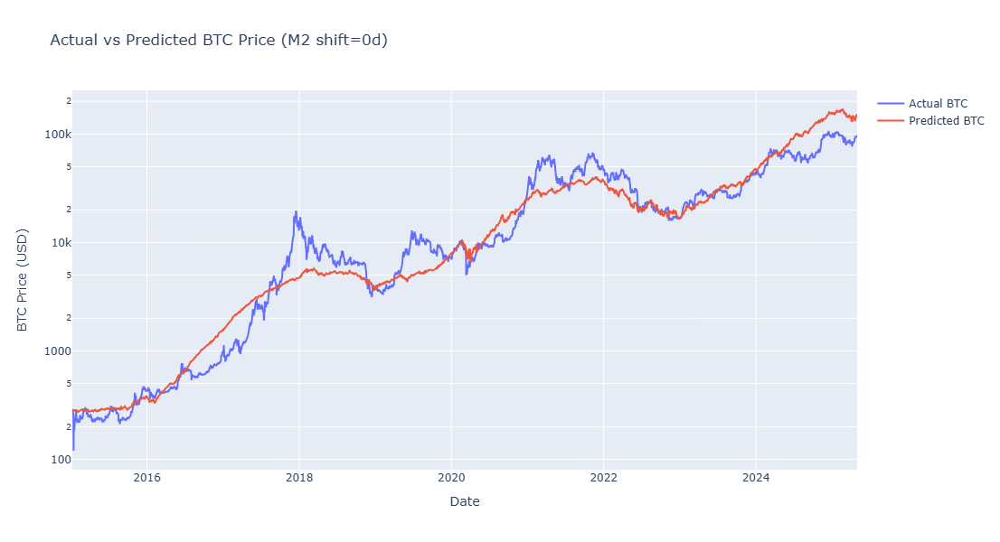

In [72]:
# Multivariate BTC Price Prediction with M2 Shift Optimization (FRED Data Only)

# 1) (Uncomment to install in Jupyter):
# !pip install pandas numpy requests scikit-learn plotly

import requests
import pandas as pd
import numpy as np
from datetime import datetime
from math import log10, sin, pi
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import plotly.graph_objects as go

# ----------------------------------------
# 2) FRED fetch helper
# ----------------------------------------
API_KEY  = "ba5525cc9cf29a46525360eb07c0a7cc"
BASE_URL = "https://api.stlouisfed.org/fred/series/observations"

def fetch_fred_series(series_id: str, start: str="2010-07-24") -> pd.Series:
    """
    Fetches a FRED series and daily-resamples it.
    Returns a pandas Series indexed by date.
    """
    params = {
        "series_id": series_id,
        "api_key":    API_KEY,
        "file_type":  "json",
        "observation_start": start
    }
    r = requests.get(BASE_URL, params=params, timeout=10)
    r.raise_for_status()
    data = r.json()["observations"]
    df = pd.DataFrame(data)
    df["date"]  = pd.to_datetime(df["date"])
    df["value"] = pd.to_numeric(df["value"], errors="coerce")
    return df.set_index("date")["value"].resample("D").ffill()

# ----------------------------------------
# 3) Halving-cycle conversion & wave model
# ----------------------------------------
H0_33 = datetime(2010,7,24,17,50,42)
H0_66 = datetime(2011,8,7,19,49,38)
H1    = datetime(2012,11,28,16,24,38)
H2    = datetime(2016,7,9,18,46,13)
H3    = datetime(2020,5,11,21,23,43)
H4    = datetime(2028,3,26)  # Next halving

BM = [699768, 467896, 591047, 542715, 576868, 593781]
a, b = 1.48, 5.44

def halving_time(t: datetime) -> float:
    """Convert calendar date to halving-cycle time h."""
    ms = t.timestamp()*1000
    if t < H0_33:
        return     ms/(BM[0]*70000)
    if t < H0_66:
        return 0.33+(ms-H0_33.timestamp()*1000)/(BM[1]*70000)
    if t < H1:
        return 0.66+(ms-H0_66.timestamp()*1000)/(BM[2]*70000)
    if t < H2:
        return   1.0+(ms-H1.timestamp()*1000)/(BM[3]*210000)
    if t < H3:
        return   2.0+(ms-H2.timestamp()*1000)/(BM[4]*210000)
    return         3.0+(ms-H3.timestamp()*1000)/(BM[5]*210000)

def btc_trend(h: float) -> float:
    """Power-law trend."""
    return 10**(a + b * np.log10(h))

def wave_middle(h: float, tr: float) -> float:
    """Middle of wave envelope oscillation."""
    wcr, wd = 0.25, 0.75
    phase = 0.75/h
    osc   = sin(2*pi*h - phase)
    decay = (1-wcr)**h
    return tr * 10**(decay*osc)

# ----------------------------------------
# 4) Fetch series from FRED
# ----------------------------------------
start_date = "2015-01-01"
today_str  = datetime.today().strftime("%Y-%m-%d")

btc    = fetch_fred_series("CBBTCUSD", start_date)
m2     = fetch_fred_series("M2SL",     start_date) / 1e3
vix    = fetch_fred_series("VIXCLS",   start_date)
nasdaq = fetch_fred_series("NASDAQCOM",start_date)

# Align indices
idx = btc.index.intersection(m2.index).intersection(vix.index).intersection(nasdaq.index)

# ----------------------------------------
# 5) Feature engineering function
# ----------------------------------------
def make_features(idx, m2_shift_days):
    """
    Build DataFrame of features for given M2 shift (days).
    Returns DataFrame with log BTC target and log-features.
    """
    df = pd.DataFrame(index=idx)
    df["btc"]     = btc.reindex(idx)
    # shift M2 and align
    df["m2"]      = m2.reindex(idx).shift(m2_shift_days)
    df["vix"]     = vix.reindex(idx)
    df["nasdaq"]  = nasdaq.reindex(idx)
    # wave features
    h_vals       = df.index.to_series().apply(halving_time)
    df["trend"]  = [btc_trend(h) for h in h_vals]
    df["middle"] = [wave_middle(h,tr) for h,tr in zip(h_vals, df["trend"])]
    # target
    df["log_btc"] = np.log(df["btc"])
    return df.dropna()

# ----------------------------------------
# 6) Optimize M2 shift
# ----------------------------------------
best_rmse = np.inf
best_shift = 0
# restrict to last 6 years for modeling
six_years_ago = pd.Timestamp.today() - pd.DateOffset(years=6)
valid_idx = idx[idx >= six_years_ago]

for shift in range(0,181,7):  # test 0,7,14,...,180 days
    df_feat = make_features(valid_idx, shift)
    X = np.log(df_feat[["trend","middle","m2","vix","nasdaq"]])
    y = df_feat["log_btc"]
    # train/test split (80/20 sequential)
    split = int(len(df_feat)*0.8)
    X_train, X_test = X[:split], X[split:]
    y_train, y_test = y[:split], y[split:]
    # fit model
    model = LinearRegression().fit(X_train, y_train)
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    if rmse < best_rmse:
        best_rmse = rmse
        best_shift = shift

print(f"Optimal M2 shift: {best_shift} days (RMSE={best_rmse:.4f})")

# ----------------------------------------
# 7) Final model with best shift
# ----------------------------------------
df_final = make_features(idx, best_shift)
X = np.log(df_final[["trend","middle","m2","vix","nasdaq"]])
y = df_final["log_btc"]
# train on full dataset
model = LinearRegression().fit(X, y)

# Predictions
y_pred_full = model.predict(X)
date_index = df_final.index

# ----------------------------------------
# 8) Plot actual vs predicted with log price
# ----------------------------------------
fig = go.Figure()
fig.add_trace(go.Scatter(x=date_index, y=np.exp(y),
                         mode='lines', name='Actual BTC'))
fig.add_trace(go.Scatter(x=date_index, y=np.exp(y_pred_full),
                         mode='lines', name='Predicted BTC'))
fig.update_layout(
    title=f"Actual vs Predicted BTC Price (M2 shift={best_shift}d)",
    xaxis_title="Date",
    yaxis_title="BTC Price (USD)",
    yaxis_type="log",
    height=600
)
fig.show()



Optimal M2 shift: 175 days (RMSE=0.1691)
Linear: RMSE=0.1691, R²=0.5752
Lasso: RMSE=0.1509, R²=0.6619
Ridge: RMSE=0.1495, R²=0.6682
Forest: RMSE=0.6002, R²=-4.3496


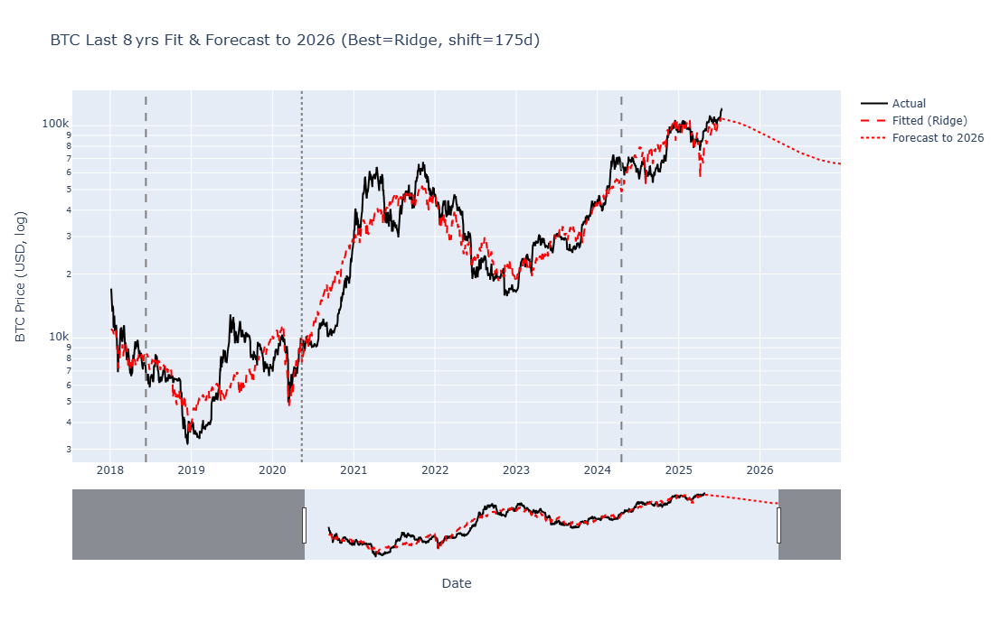

In [83]:
# Bitcoin Prediction Using Last 8 Years for Fitting & Forecast to 2026

# 1) Install dependencies if needed:
# !pip install pandas numpy requests scikit-learn plotly

import requests
import pandas as pd
import numpy as np
from datetime import datetime
from math import sin, pi
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import plotly.graph_objects as go

# 2) FRED fetch & fill helper
API_KEY  = "ba5525cc9cf29a46525360eb07c0a7cc"
BASE_URL = "https://api.stlouisfed.org/fred/series/observations"

def fetch_and_fill(series_id: str, start: str):
    params = {
        "series_id":         series_id,
        "api_key":           API_KEY,
        "file_type":         "json",
        "observation_start": start
    }
    r = requests.get(BASE_URL, params=params, timeout=10)
    r.raise_for_status()
    data = r.json().get("observations", [])
    df = pd.DataFrame(data)
    df["date"]  = pd.to_datetime(df["date"])
    df["value"] = pd.to_numeric(df["value"], errors="coerce")
    s = df.set_index("date")["value"].resample("D").asfreq()
    return s.interpolate(method="time").ffill().bfill()

# 3) Halving-cycle & wave model
halving_dates = [
    datetime(2010,7,24,17,50,42),
    datetime(2011,8,7,19,49,38),
    datetime(2012,11,28,16,24,38),
    datetime(2016,7,9,18,46,13),
    datetime(2020,5,11,21,23,43),
    datetime(2028,3,26)
]
BM = [699768,467896,591047,542715,576868,593781]
a, b = 1.48, 5.44

def halving_time(t: datetime) -> float:
    ms = t.timestamp()*1000
    for i in range(len(halving_dates)-1):
        if t < halving_dates[i+1]:
            start_ms = halving_dates[i].timestamp()*1000
            blocks = 210000 if i >= 1 else 70000
            return i + (ms - start_ms)/(BM[i]*blocks)
    start_ms = halving_dates[-2].timestamp()*1000
    return len(halving_dates)-2 + (ms - start_ms)/(BM[-1]*210000)

def btc_trend(h: float) -> float:
    return 10**(a + b * np.log10(h))

def wave_mid(h: float, tr: float) -> float:
    osc = sin(2*pi*h - 0.75/h)
    decay = (1-0.25)**h
    return tr * 10**(decay * osc)

# 4) Fetch data for last 8 years
today = pd.Timestamp.today()
start_8y = (today - pd.DateOffset(years=8)).strftime("%Y-%m-%d")

btc    = fetch_and_fill("CBBTCUSD",  start_8y)
m2     = fetch_and_fill("M2SL",      start_8y)/1e3
vix    = fetch_and_fill("VIXCLS",    start_8y)
nasdaq = fetch_and_fill("NASDAQCOM", start_8y)
fed    = fetch_and_fill("FEDFUNDS",  start_8y)
cpi    = fetch_and_fill("CPIAUCSL",  start_8y)
gdp_q  = fetch_and_fill("GDPC1",     start_8y); gdp = gdp_q.ffill()

# Create indices
model_idx    = pd.date_range(start=btc.index[0], end=today,       freq="D")
forecast_idx = pd.date_range(start=btc.index[0], end="2026-12-31", freq="D")

# Reindex & fill
series = [btc, m2, vix, nasdaq, fed, cpi, gdp]
series = [s.reindex(forecast_idx).ffill().bfill() for s in series]
btc, m2, vix, nasdaq, fed, cpi, gdp = series

# 5) Feature builder
def make_features(idx, shift):
    df = pd.DataFrame(index=idx)
    df["btc"]    = btc[idx]
    df["m2"]     = m2[idx].shift(shift)
    df["vix"]    = vix[idx]
    df["nasdaq"] = nasdaq[idx]
    df["fed"]    = fed[idx]
    df["cpi"]    = cpi[idx]
    df["gdp"]    = gdp[idx]
    hvals = idx.to_series().apply(halving_time)
    df["trend"]  = [btc_trend(h) for h in hvals]
    df["middle"] = [wave_mid(h,tr) for h,tr in zip(hvals, df["trend"])]
    df["log_btc"] = np.log(df["btc"])
    return df.dropna()

# 6) Optimize M2 shift on model_idx
best_rmse, best_shift = np.inf, 0
for shift in range(0, 181, 7):
    df6 = make_features(model_idx, shift)
    if len(df6) < 100:
        continue
    feats = ["trend","middle","m2","vix","nasdaq","fed","cpi","gdp"]
    X6, y6 = np.log(df6[feats]), df6["log_btc"]
    Xtr, Xte = X6.iloc[:-int(0.2*len(X6))], X6.iloc[-int(0.2*len(X6)):]
    ytr, yte = y6.iloc[:-int(0.2*len(y6))], y6.iloc[-int(0.2*len(y6)):]
    rmse = np.sqrt(mean_squared_error(yte, LinearRegression().fit(Xtr,ytr).predict(Xte)))
    if rmse < best_rmse:
        best_rmse, best_shift = rmse, shift

print(f"Optimal M2 shift: {best_shift} days (RMSE={best_rmse:.4f})")

# 7) Train & compare models on model_idx
df_full = make_features(model_idx, best_shift)
feats   = ["trend","middle","m2","vix","nasdaq","fed","cpi","gdp"]
X_full, y_full = np.log(df_full[feats]), df_full["log_btc"]
Xtr, Xte = X_full.iloc[:-int(0.2*len(X_full))], X_full.iloc[-int(0.2*len(X_full)):]
ytr, yte = y_full.iloc[:-int(0.2*len(y_full))], y_full.iloc[-int(0.2*len(y_full)):]

models = {
    "Linear": LinearRegression(),
    "Lasso":  Lasso(alpha=1e-3, max_iter=5000),
    "Ridge":  Ridge(alpha=1.0),
    "Forest": RandomForestRegressor(n_estimators=100, random_state=0)
}
results = {}
for name, mdl in models.items():
    mdl.fit(Xtr, ytr)
    pred = mdl.predict(Xte)
    results[name] = (np.sqrt(mean_squared_error(yte, pred)),
                     r2_score(yte, pred), mdl)

for n,(rmse,r2,_) in results.items():
    print(f"{n}: RMSE={rmse:.4f}, R²={r2:.4f}")

best_name, best_model = min(results, key=lambda k: results[k][0]), results[min(results, key=lambda k: results[k][0])][2]

# 8) Forecast through 2026
df_ext  = make_features(forecast_idx, best_shift)
X_ext   = np.log(df_ext[feats])
y_ext_pred = best_model.predict(X_ext)

# 9) Plot actual+fitted on last 8y and forecast correctly
fig = go.Figure()

# 9a) Actual & fitted on model_idx period
fig.add_trace(go.Scatter(
    x=df_full.index,
    y=np.exp(y_full),
    mode='lines',
    name='Actual',
    line=dict(color='black')
))
fig.add_trace(go.Scatter(
    x=df_full.index,
    y=np.exp(best_model.predict(X_full)),
    mode='lines',
    name=f'Fitted ({best_name})',
    line=dict(color='red', dash='dash')
))

# 9b) Forecast after today, using df_ext index (aligned)
fc_mask = df_ext.index > today
fc_idx  = df_ext.index[fc_mask]
fc_vals = np.exp(y_ext_pred[fc_mask])
fig.add_trace(go.Scatter(
    x=fc_idx,
    y=fc_vals,
    mode='lines',
    name='Forecast to 2026',
    line=dict(color='red', dash='dot')
))

# 9c) Halving lines & midpoints
for d in halving_dates[2:]:
    fig.add_vline(x=d, line=dict(color='gray', dash='dot'))
mids = [
    halving_dates[i] + (halving_dates[i+1] - halving_dates[i]) / 2
    for i in range(2, 5)
]
for d in mids:
    fig.add_vline(x=d, line=dict(color='gray', dash='dash'))

# 9d) Layout
fig.update_layout(
    title=f"BTC Last 8 yrs Fit & Forecast to 2026 (Best={best_name}, shift={best_shift}d)",
    xaxis=dict(
        title='Date',
        range=[model_idx.min(), '2026-12-31'],
        rangeslider=dict(visible=True),
        type='date'
    ),
    yaxis=dict(title='BTC Price (USD, log)', type='log'),
    height=700,
    dragmode='zoom',
    hovermode='x unified'
)

# Show with scroll and Y-axis zoom
fig.show(config={'scrollZoom':True,'modeBarButtonsToAdd':['zoom2d','zoomY']})


Optimal M2 shift: 175 days (RMSE=0.2200)
Linear: RMSE=0.2200
Lasso: RMSE=0.1772
Ridge: RMSE=0.1563
Forest: RMSE=0.6591


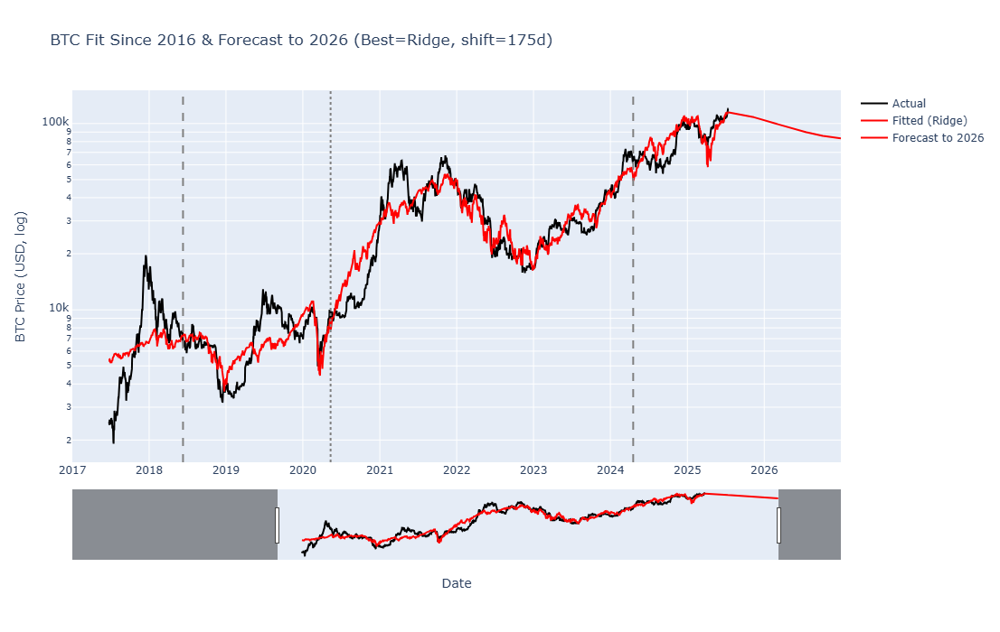

In [87]:
# Updated BTC Prediction: Fit from 2016, Solid Red Lines for Fitted & Forecast

# 1) Install dependencies if needed:
# !pip install pandas numpy requests scikit-learn plotly

import requests
import pandas as pd
import numpy as np
from datetime import datetime
from math import sin, pi
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import plotly.graph_objects as go

# 2) FRED fetch & fill helper
API_KEY  = "ba5525cc9cf29a46525360eb07c0a7cc"
BASE_URL = "https://api.stlouisfed.org/fred/series/observations"
def fetch_and_fill(series_id, start):
    params = {"series_id":series_id,"api_key":API_KEY,
              "file_type":"json","observation_start":start}
    r = requests.get(BASE_URL, params=params, timeout=10); r.raise_for_status()
    data = r.json().get("observations",[])
    df = pd.DataFrame(data)
    df["date"]  = pd.to_datetime(df["date"])
    df["value"] = pd.to_numeric(df["value"], errors="coerce")
    s = df.set_index("date")["value"].resample("D").asfreq()
    return s.interpolate("time").ffill().bfill()

# 3) Halving & wave functions
halving_dates = [
    datetime(2010,7,24,17,50,42), datetime(2011,8,7,19,49,38),
    datetime(2012,11,28,16,24,38), datetime(2016,7,9,18,46,13),
    datetime(2020,5,11,21,23,43), datetime(2028,3,26)
]
BM=[699768,467896,591047,542715,576868,593781]
a,b=1.48,5.44
def halving_time(t):
    ms=t.timestamp()*1000
    for i in range(len(halving_dates)-1):
        if t<halving_dates[i+1]:
            start_ms=halving_dates[i].timestamp()*1000
            blocks=210000 if i>=1 else 70000
            return i+(ms-start_ms)/(BM[i]*blocks)
    start_ms=halving_dates[-2].timestamp()*1000
    return len(halving_dates)-2 + (ms-start_ms)/(BM[-1]*210000)
def btc_trend(h): return 10**(a + b*np.log10(h))
def wave_mid(h,tr):
    osc=sin(2*pi*h-0.75/h); decay=(1-0.25)**h
    return tr*10**(decay*osc)

# 4) Fetch data from 2016-01-01
today = pd.Timestamp.today()
start_fit = "2017-01-01"
btc    = fetch_and_fill("CBBTCUSD",  start_fit)
m2     = fetch_and_fill("M2SL",      start_fit)/1e3
vix    = fetch_and_fill("VIXCLS",    start_fit)
nasdaq = fetch_and_fill("NASDAQCOM", start_fit)
fed    = fetch_and_fill("FEDFUNDS",  start_fit)
cpi    = fetch_and_fill("CPIAUCSL",  start_fit)
gdp_q  = fetch_and_fill("GDPC1",     start_fit); gdp=gdp_q.ffill()

# Build indices
model_idx    = pd.date_range(start=start_fit, end=today,       freq="D")
forecast_idx = pd.date_range(start=start_fit, end="2026-12-31", freq="D")
# reindex and fill
series_list=[btc,m2,vix,nasdaq,fed,cpi,gdp]
series_list=[s.reindex(forecast_idx).ffill().bfill() for s in series_list]
btc,m2,vix,nasdaq,fed,cpi,gdp=series_list

# 5) Feature builder
def make_features(idx, shift):
    df=pd.DataFrame(index=idx)
    df["btc"]=btc[idx]; df["m2"]=m2[idx].shift(shift)
    df["vix"]=vix[idx]; df["nasdaq"]=nasdaq[idx]
    df["fed"]=fed[idx]; df["cpi"]=cpi[idx]; df["gdp"]=gdp[idx]
    hvals=idx.to_series().apply(halving_time)
    df["trend"]=[btc_trend(h) for h in hvals]
    df["middle"]=[wave_mid(h,tr) for h,tr in zip(hvals,df["trend"])]
    df["log_btc"]=np.log(df["btc"])
    return df.dropna()

# 6) Optimize M2 shift
best_rmse,best_shift=np.inf,0
for shift in range(0,181,7):
    df6=make_features(model_idx,shift)
    if len(df6)<100: continue
    feats=["trend","middle","m2","vix","nasdaq","fed","cpi","gdp"]
    X=np.log(df6[feats]); y=df6["log_btc"]
    split=int(0.8*len(X))
    Xtr,Xte=X[:split],X[split:]; ytr,yte=y[:split],y[split:]
    rmse=np.sqrt(mean_squared_error(yte,LinearRegression().fit(Xtr,ytr).predict(Xte)))
    if rmse<best_rmse: best_rmse,best_shift=rmse,shift

print(f"Optimal M2 shift: {best_shift} days (RMSE={best_rmse:.4f})")

# 7) Train & compare
df_full=make_features(model_idx,best_shift)
feats=["trend","middle","m2","vix","nasdaq","fed","cpi","gdp"]
X_full,y_full=np.log(df_full[feats]),df_full["log_btc"]
split=int(0.8*len(X_full))
Xtr,Xte=X_full[:split],X_full[split:]; ytr,yte=y_full[:split],y_full[split:]
models = {
    "Linear": LinearRegression(),
    "Lasso":  Lasso(alpha=1e-3, max_iter=5000),
    "Ridge":  Ridge(alpha=1.0),
    "Forest": RandomForestRegressor(n_estimators=100, random_state=0)
}
results={}
for n,m in models.items():
    m.fit(Xtr,ytr); p=m.predict(Xte)
    results[n]=(np.sqrt(mean_squared_error(yte,p)),r2_score(yte,p),m)
for n,(r,_r2,_) in results.items(): print(f"{n}: RMSE={r:.4f}")
best_name= min(results,key=lambda k:results[k][0]); best_model=results[best_name][2]

# 8) Forecast
df_ext=make_features(forecast_idx,best_shift)
X_ext=np.log(df_ext[feats]); y_ext_pred=best_model.predict(X_ext)

# 9) Plot actual & fitted on model_idx, then forecast from today→2026

fig = go.Figure()

# Actual & fitted (solid red for fitted)
fig.add_trace(go.Scatter(
    x=df_full.index,
    y=np.exp(y_full),
    mode='lines',
    name='Actual',
    line=dict(color='black')
))
fig.add_trace(go.Scatter(
    x=df_full.index,
    y=np.exp(best_model.predict(X_full)),
    mode='lines',
    name=f'Fitted ({best_name})',
    line=dict(color='red', width=2)        # solid red
))

# Forecast (solid red)
# Use df_ext.index for alignment
fc_mask = df_ext.index > today
fc_idx  = df_ext.index[fc_mask]
fc_vals = np.exp(y_ext_pred[fc_mask])
fig.add_trace(go.Scatter(
    x=fc_idx,
    y=fc_vals,
    mode='lines',
    name='Forecast to 2026',
    line=dict(color='red', width=2)        # solid red
))

# Halving & midpoints
for d in halving_dates[2:]:
    fig.add_vline(x=d, line=dict(color='gray', dash='dot'))
mids = [
    halving_dates[i] + (halving_dates[i+1] - halving_dates[i]) / 2
    for i in range(2, 5)
]
for d in mids:
    fig.add_vline(x=d, line=dict(color='gray', dash='dash'))

fig.update_layout(
    title=f"BTC Fit Since 2016 & Forecast to 2026 (Best={best_name}, shift={best_shift}d)",
    xaxis=dict(
        title='Date',
        range=[start_fit, '2026-12-31'],
        rangeslider=dict(visible=True),
        type='date'
    ),
    yaxis=dict(title='BTC Price (USD, log)', type='log'),
    height=700,
    hovermode='x unified',
    dragmode='zoom'
)
fig.show(config={'scrollZoom': True, 'modeBarButtonsToAdd': ['zoom2d','zoomY']})

Optimal lags (days): {'M2SL': -1, 'VIXCLS': -1, 'NASDAQCOM': -1, 'FEDFUNDS': -1, 'CPIAUCSL': -1, 'GDPC1': -1}
Train RMSE: 0.9807948351388868


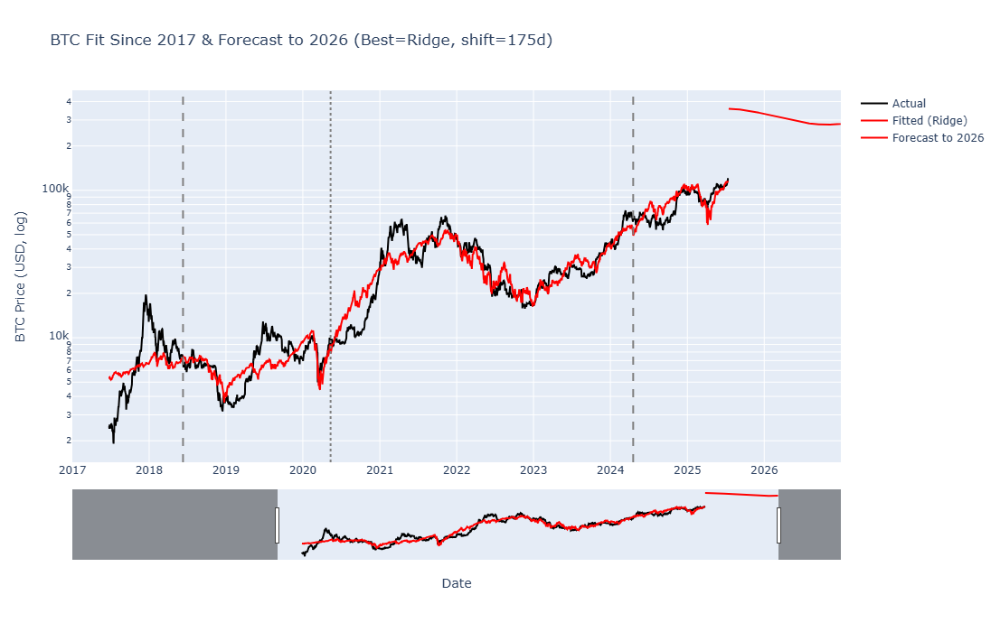

In [92]:
# BTC Prediction with Automatic Lag Optimization for All Predictors (Fit Since 2017)

# 1) Install dependencies if needed:
# !pip install pandas numpy requests scikit-learn plotly

import requests
import pandas as pd
import numpy as np
from datetime import datetime
from math import sin, pi
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import plotly.graph_objects as go

# 2) FRED fetch & fill helper
API_KEY  = "ba5525cc9cf29a46525360eb07c0a7cc"
BASE_URL = "https://api.stlouisfed.org/fred/series/observations"
def fetch_and_fill(series_id, start):
    params = {"series_id":series_id,"api_key":API_KEY,
              "file_type":"json","observation_start":start}
    r = requests.get(BASE_URL, params=params); r.raise_for_status()
    df = pd.DataFrame(r.json()["observations"])
    df["date"]  = pd.to_datetime(df["date"])
    df["value"] = pd.to_numeric(df["value"],errors="coerce")
    s = df.set_index("date")["value"].resample("D").asfreq()
    return s.interpolate("time").ffill().bfill()

# 3) Halving & wave functions
halving_dates=[datetime(2010,7,24,17,50,42),datetime(2011,8,7,19,49,38),
               datetime(2012,11,28,16,24,38),datetime(2016,7,9,18,46,13),
               datetime(2020,5,11,21,23,43),datetime(2028,3,26)]
BM=[699768,467896,591047,542715,576868,593781]; a,b=1.48,5.44
def halving_time(t):
    ms=t.timestamp()*1000
    for i in range(len(halving_dates)-1):
        if t<halving_dates[i+1]:
            start_ms=halving_dates[i].timestamp()*1000
            blocks=210000 if i>=1 else 70000
            return i+(ms-start_ms)/(BM[i]*blocks)
    start_ms=halving_dates[-2].timestamp()*1000
    return len(halving_dates)-2+(ms-start_ms)/(BM[-1]*210000)
def btc_trend(h): return 10**(a+b*np.log10(h))
def wave_mid(h,tr):
    osc=sin(2*pi*h-0.75/h); decay=(1-0.25)**h
    return tr*10**(decay*osc)

# 4) Fetch data since 2017-01-01
today=pd.Timestamp.today()
start="2017-01-01"
symbols=["CBBTCUSD","M2SL","VIXCLS","NASDAQCOM","FEDFUNDS","CPIAUCSL","GDPC1"]
series={sym: fetch_and_fill(sym,start) for sym in symbols}
series["M2SL"]/=1e3
series["GDPC1"]=series["GDPC1"].ffill()

# build full index
full_idx=pd.date_range(start=start,end="2026-12-31",freq="D")
for key in series:
    series[key]=series[key].reindex(full_idx).ffill().bfill()

# 5) Automatic lag selection for each predictor
# predictors exclude BTC itself
preds=["M2SL","VIXCLS","NASDAQCOM","FEDFUNDS","CPIAUCSL","GDPC1"]
lags={}
# use last 3 years for lag optimization
opt_idx=full_idx[full_idx>=today-pd.DateOffset(years=3)]
logbtc=np.log(series["CBBTCUSD"].reindex(opt_idx))
for p in preds:
    best_corr, best_lag=0,0
    for lag in range(-1,0,1):
        corr=logbtc.corr(np.log(series[p].shift(lag).reindex(opt_idx)))
        if abs(corr)>abs(best_corr):
            best_corr, best_lag=corr,lag
    lags[p]=best_lag

print("Optimal lags (days):", lags)

# 6) Build features with those lags
def make_features(idx):
    df=pd.DataFrame(index=idx)
    df["btc"]=series["CBBTCUSD"].reindex(idx)
    # apply lags
    for p in preds:
        df[p]=series[p].shift(lags[p]).reindex(idx)
    # wave features
    hvals=idx.to_series().apply(halving_time)
    df["trend"]=[btc_trend(h) for h in hvals]
    df["middle"]=[wave_mid(h,tr) for h,tr in zip(hvals,df["trend"])]
    df["log_btc"]=np.log(df["btc"])
    return df.dropna()

# 7) Prepare training data (2017→today)
train_idx=full_idx[(full_idx>=start)&(full_idx<=today)]
df=make_features(train_idx)
X=df[preds+["trend","middle"]].apply(np.log)
y=df["log_btc"]

# train/test split last 20%
split=int(len(df)*0.8)
Xtr,Xte=X[:split],X[split:]
ytr,yte=y[:split],y[split:]

model=LinearRegression().fit(Xtr,ytr)
print("Train RMSE:",np.sqrt(mean_squared_error(yte,model.predict(Xte))))

# 8) Forecast to 2026
df_ext=make_features(full_idx)
Xext=df_ext[preds+["trend","middle"]].apply(np.log)
yext_pred=model.predict(Xext)

# 9) Plot actual & fitted on model_idx, then forecast correctly aligned
fig = go.Figure()

# Actual & fitted
fig.add_trace(go.Scatter(
    x=df_full.index,
    y=np.exp(y_full),
    mode='lines',
    name='Actual',
    line=dict(color='black')
))
fig.add_trace(go.Scatter(
    x=df_full.index,
    y=np.exp(best_model.predict(X_full)),
    mode='lines',
    name=f'Fitted ({best_name})',
    line=dict(color='red', width=2)
))

# Forecast — use df_ext.index for mask & values
forecast_mask = df_ext.index > today
fc_idx  = df_ext.index[forecast_mask]
fc_vals = np.exp(yext_pred[forecast_mask])
fig.add_trace(go.Scatter(
    x=fc_idx,
    y=fc_vals,
    mode='lines',
    name='Forecast to 2026',
    line=dict(color='red', width=2)
))

# Halving & midpoints
for d in halving_dates[2:]:
    fig.add_vline(x=d, line=dict(color='gray', dash='dot'))
mids = [
    halving_dates[i] + (halving_dates[i+1] - halving_dates[i]) / 2
    for i in range(2, 5)
]
for d in mids:
    fig.add_vline(x=d, line=dict(color='gray', dash='dash'))

fig.update_layout(
    title=f"BTC Fit Since 2017 & Forecast to 2026 (Best={best_name}, shift={best_shift}d)",
    xaxis=dict(
        title='Date',
        range=[start_fit, '2026-12-31'],
        rangeslider=dict(visible=True),
        type='date'
    ),
    yaxis=dict(title='BTC Price (USD, log)', type='log'),
    height=700,
    hovermode='x unified',
    dragmode='zoom'
)
fig.show(config={'scrollZoom': True, 'modeBarButtonsToAdd': ['zoom2d','zoomY']})
